In [1]:
import warnings
warnings.simplefilter('ignore')
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import cross_val_score, GridSearchCV, train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, IsolationForest, ExtraTreesRegressor
from sklearn.metrics import mean_squared_error, r2_score

In [ ]:
!wget "https://github.com/akki8087/Big-Mart-Sales/raw/master/Train.csv"

In [2]:
data = pd.read_csv('Train.csv')

In [3]:
data.head()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDA15,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380
1,DRC01,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228
2,FDN15,17.50,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700
3,FDX07,19.20,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,NaN,Tier 3,Grocery Store,732.3800
4,NCD19,8.93,Low Fat,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052


In [3]:
print(data.shape)
data.describe().T

(8523, 12)


,count,mean,std,min,25%,50%,75%,max
Item_Weight,7060.0,12.857645,4.643456,4.555,8.773750,12.600000,16.850000,21.350000
Item_Visibility,8523.0,0.066132,0.051598,0.000,0.026989,0.053931,0.094585,0.328391
Item_MRP,8523.0,140.992782,62.275067,31.290,93.826500,143.012800,185.643700,266.888400
Outlet_Establishment_Year,8523.0,1997.831867,8.371760,1985.000,1987.000000,1999.000000,2004.000000,2009.000000
Item_Outlet_Sales,8523.0,2181.288914,1706.499616,33.290,834.247400,1794.331000,3101.296400,13086.964800


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Item_Identifier            8523 non-null   object 
 1   Item_Weight                7060 non-null   float64
 2   Item_Fat_Content           8523 non-null   object 
 3   Item_Visibility            8523 non-null   float64
 4   Item_Type                  8523 non-null   object 
 5   Item_MRP                   8523 non-null   float64
 6   Outlet_Identifier          8523 non-null   object 
 7   Outlet_Establishment_Year  8523 non-null   int64  
 8   Outlet_Size                6113 non-null   object 
 9   Outlet_Location_Type       8523 non-null   object 
 10  Outlet_Type                8523 non-null   object 
 11  Item_Outlet_Sales          8523 non-null   float64
dtypes: float64(4), int64(1), object(7)
memory usage: 799.2+ KB


In [9]:
data.head()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDA15,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380
1,DRC01,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228
2,FDN15,17.50,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700
3,FDX07,19.20,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,Medium,Tier 3,Grocery Store,732.3800
4,NCD19,8.93,Low Fat,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052


In [5]:
data.isna().sum()

Item_Identifier                 0
Item_Weight                  1463
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                  2410
Outlet_Location_Type            0
Outlet_Type                     0
Item_Outlet_Sales               0
dtype: int64

In [6]:
data['Item_Weight'].interpolate(inplace=True)
data['Item_Weight'].isnull().sum()

0

In [7]:
data['Outlet_Size'].fillna(data['Outlet_Size'].mode()[0], inplace=True)
data['Outlet_Size'].isnull().sum()

0

In [8]:
print(f'Number of unique values in "Estd. Year" is {data.Outlet_Establishment_Year.nunique()}')
print(data.Outlet_Establishment_Year.value_counts(dropna=False))
data.Outlet_Establishment_Year = data.Outlet_Establishment_Year.astype('object')

Number of unique values in "Estd. Year" is 9
1985    1463
1987     932
2004     930
1997     930
1999     930
2002     929
2009     928
2007     926
1998     555
Name: Outlet_Establishment_Year, dtype: int64


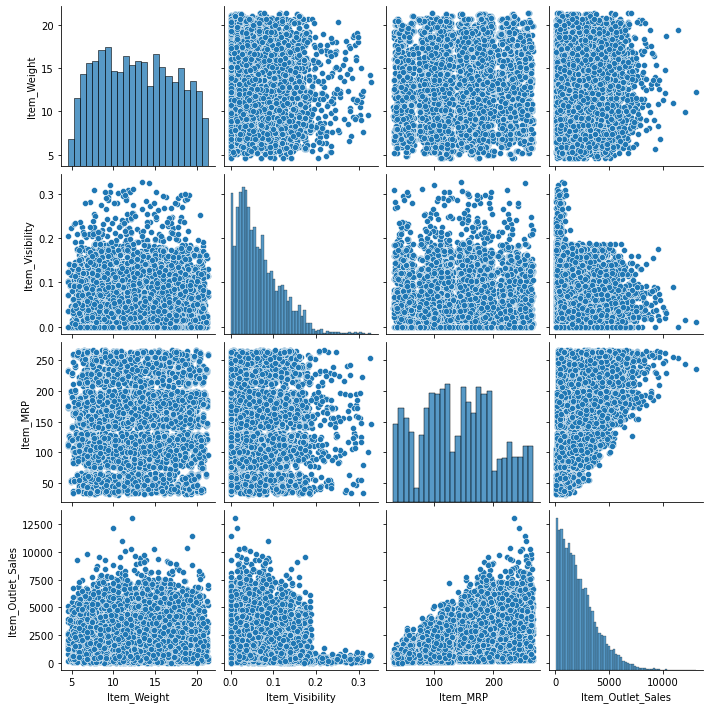

In [10]:
# num_cols = [* data.select_dtypes(['int64', 'float64']).columns]
# sns.pairplot(data[num_cols])

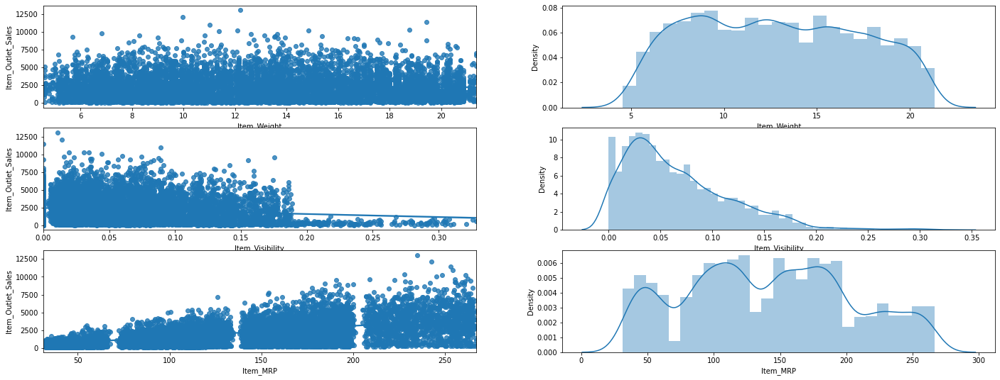

In [11]:
num_cols.remove('Item_Outlet_Sales')
count = 1
plt.figure(figsize = (24, 9))
for col in num_cols:
    plt.subplot(3, 2, count)
    sns.regplot(x = col, y = 'Item_Outlet_Sales', data = data)
    plt.xlabel(col)
    count += 1
    plt.subplot(3, 2, count)
    sns.distplot(data.loc[data[col].notnull(), col])
    count += 1

In [10]:
obj_cols = [ * data.select_dtypes('object').columns]

for col in obj_cols:
    if data[col].nunique() > 10:
        print(f'Number of unique values in {col} is {data[col].nunique()} so not printing values')
        print()
    else:
        print(f'Values in {col} are :\n{data[col].value_counts()}')
        print()

Number of unique values in Item_Identifier is 1559 so not printing values

Values in Item_Fat_Content are :
Low Fat    5089
Regular    2889
LF          316
reg         117
low fat     112
Name: Item_Fat_Content, dtype: int64

Number of unique values in Item_Type is 16 so not printing values

Values in Outlet_Identifier are :
OUT027    935
OUT013    932
OUT049    930
OUT035    930
OUT046    930
OUT045    929
OUT018    928
OUT017    926
OUT010    555
OUT019    528
Name: Outlet_Identifier, dtype: int64

Values in Outlet_Establishment_Year are :
1985    1463
1987     932
1997     930
1999     930
2004     930
2002     929
2009     928
2007     926
1998     555
Name: Outlet_Establishment_Year, dtype: int64

Values in Outlet_Size are :
Medium    5203
Small     2388
High       932
Name: Outlet_Size, dtype: int64

Values in Outlet_Location_Type are :
Tier 3    3350
Tier 2    2785
Tier 1    2388
Name: Outlet_Location_Type, dtype: int64

Values in Outlet_Type are :
Supermarket Type1    5577
Groc

In [12]:
data['Item_Fat_Content'].value_counts(dropna=False)

Low Fat    5089
Regular    2889
LF          316
reg         117
low fat     112
Name: Item_Fat_Content, dtype: int64

In [13]:
data['Item_Fat_Content'].replace({'LF': "Low Fat", 'low fat': 'Low Fat', 'reg': 'Regular'}, inplace=True)
data['Item_Fat_Content'].value_counts(dropna=False)

Low Fat    5517
Regular    3006
Name: Item_Fat_Content, dtype: int64

In [14]:
print(data['Item_Identifier'].sample(10))
print(data['Item_Identifier'].str[:3].value_counts(dropna = False))
print(data['Item_Identifier'].str[:2].value_counts(dropna = False))

data['Item_Identifier'] = data['Item_Identifier'].str[:2]

7941    FDW09
6259    FDC46
4947    NCB55
1245    DRA12
5004    FDK24
2303    FDV59
5495    NCA53
7650    NCE30
2616    DRI01
5312    FDY02
Name: Item_Identifier, dtype: object
FDX    295
FDT    281
FDS    279
FDR    275
FDY    271
      ... 
DRO     14
DRP     12
DRZ     11
DRQ      7
DRY      6
Name: Item_Identifier, Length: 71, dtype: int64
FD    6125
NC    1599
DR     799
Name: Item_Identifier, dtype: int64


In [15]:
data['Item_Fat_Content'] = np.where(data['Item_Identifier'] == 'NC', 'Non-edible', data['Item_Fat_Content'])

In [16]:
data.sample(10)

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
4892,FD,5.6750,Regular,0.023497,Snack Foods,156.1288,OUT046,1997,Small,Tier 1,Supermarket Type1,2828.3184
7741,FD,6.6500,Low Fat,0.053280,Canned,147.7734,OUT035,2004,Small,Tier 2,Supermarket Type1,2078.6276
2173,FD,12.3500,Regular,0.033829,Meat,196.9426,OUT045,2002,Medium,Tier 2,Supermarket Type1,2768.3964
1656,FD,13.6500,Regular,0.013036,Fruits and Vegetables,114.7834,OUT035,2004,Small,Tier 2,Supermarket Type1,3455.5020
920,FD,11.4725,Regular,0.057870,Breakfast,49.7008,OUT019,1985,Small,Tier 1,Grocery Store,50.6008
5524,FD,15.1750,Low Fat,0.136120,Fruits and Vegetables,94.1094,OUT019,1985,Small,Tier 1,Grocery Store,190.4188
812,FD,7.8650,Low Fat,0.061009,Breakfast,166.0526,OUT013,1987,High,Tier 3,Supermarket Type1,3617.9572
6723,FD,12.8000,Low Fat,0.069606,Starchy Foods,261.9252,OUT035,2004,Small,Tier 2,Supermarket Type1,4984.1788
6301,DR,8.6700,Low Fat,0.065437,Soft Drinks,142.9128,OUT046,1997,Small,Tier 1,Supermarket Type1,2013.3792
468,FD,7.9750,Low Fat,0.014661,Baking Goods,85.1250,OUT045,2002,Medium,Tier 2,Supermarket Type1,2663.2000


In [18]:
df = pd.get_dummies(data, drop_first = True)
df.head()

,Item_Weight,Item_Visibility,Item_MRP,Item_Outlet_Sales,Item_Identifier_FD,Item_Identifier_NC,Item_Fat_Content_Non-edible,Item_Fat_Content_Regular,Item_Type_Breads,Item_Type_Breakfast,...,Outlet_Establishment_Year_2004,Outlet_Establishment_Year_2007,Outlet_Establishment_Year_2009,Outlet_Size_Medium,Outlet_Size_Small,Outlet_Location_Type_Tier 2,Outlet_Location_Type_Tier 3,Outlet_Type_Supermarket Type1,Outlet_Type_Supermarket Type2,Outlet_Type_Supermarket Type3
0,9.30,0.016047,249.8092,3735.1380,1,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
1,5.92,0.019278,48.2692,443.4228,0,0,0,1,0,0,...,0,0,1,1,0,0,1,0,1,0
2,17.50,0.016760,141.6180,2097.2700,1,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
3,19.20,0.000000,182.0950,732.3800,1,0,0,1,0,0,...,0,0,0,1,0,0,1,0,0,0
4,8.93,0.000000,53.8614,994.7052,0,1,1,0,0,0,...,0,0,0,0,0,0,1,1,0,0


In [19]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Item_Weight,8523.0,12.831222,4.445074,4.555,9.000000,12.600000,16.600000,21.350000
Item_Visibility,8523.0,0.066132,0.051598,0.000,0.026989,0.053931,0.094585,0.328391
Item_MRP,8523.0,140.992782,62.275067,31.290,93.826500,143.012800,185.643700,266.888400
Item_Outlet_Sales,8523.0,2181.288914,1706.499616,33.290,834.247400,1794.331000,3101.296400,13086.964800
Item_Identifier_FD,8523.0,0.718644,0.449687,0.000,0.000000,1.000000,1.000000,1.000000
Item_Identifier_NC,8523.0,0.187610,0.390423,0.000,0.000000,0.000000,0.000000,1.000000
Item_Fat_Content_Non-edible,8523.0,0.187610,0.390423,0.000,0.000000,0.000000,0.000000,1.000000
Item_Fat_Content_Regular,8523.0,0.352693,0.477836,0.000,0.000000,0.000000,1.000000,1.000000
Item_Type_Breads,8523.0,0.029450,0.169073,0.000,0.000000,0.000000,0.000000,1.000000
Item_Type_Breakfast,8523.0,0.012906,0.112877,0.000,0.000000,0.000000,0.000000,1.000000


In [20]:
df['Non-Visible'] = np.where(df['Item_Visibility'] == 0, 1, 0)
df['Non-Visible'].value_counts(dropna = False)

0    7997
1     526
Name: Non-Visible, dtype: int64

In [21]:
df.head()

,Item_Weight,Item_Visibility,Item_MRP,Item_Outlet_Sales,Item_Identifier_FD,Item_Identifier_NC,Item_Fat_Content_Non-edible,Item_Fat_Content_Regular,Item_Type_Breads,Item_Type_Breakfast,...,Outlet_Establishment_Year_2007,Outlet_Establishment_Year_2009,Outlet_Size_Medium,Outlet_Size_Small,Outlet_Location_Type_Tier 2,Outlet_Location_Type_Tier 3,Outlet_Type_Supermarket Type1,Outlet_Type_Supermarket Type2,Outlet_Type_Supermarket Type3,Non-Visible
0,9.30,0.016047,249.8092,3735.1380,1,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
1,5.92,0.019278,48.2692,443.4228,0,0,0,1,0,0,...,0,1,1,0,0,1,0,1,0,0
2,17.50,0.016760,141.6180,2097.2700,1,0,0,0,0,0,...,0,0,1,0,0,0,1,0,0,0
3,19.20,0.000000,182.0950,732.3800,1,0,0,1,0,0,...,0,0,1,0,0,1,0,0,0,1
4,8.93,0.000000,53.8614,994.7052,0,1,1,0,0,0,...,0,0,0,0,0,1,1,0,0,1


In [22]:
X, y = df.drop('Item_Outlet_Sales', axis = 1), df.Item_Outlet_Sales

In [23]:
X.shape, y.shape

((8523, 47), (8523,))

In [24]:
y.head()

0    3735.1380
1     443.4228
2    2097.2700
3     732.3800
4     994.7052
Name: Item_Outlet_Sales, dtype: float64

In [25]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 123)

In [26]:
lr = LinearRegression()
lr.fit(X_train, y_train)
lr_pred = lr.predict(X_test)
print(np.sqrt(mean_squared_error(y_test, lr_pred)))

1113.939184607956


In [27]:
rf = RandomForestRegressor(max_depth = 5)
rf.fit(X_train, y_train)
rf_pred = rf.predict(X_test)
print(np.sqrt(mean_squared_error(y_test, rf_pred)))

1072.1694961001008


In [28]:
gbm = GradientBoostingRegressor(max_depth = 2)
gbm.fit(X_train, y_train)
gbm_pred = gbm.predict(X_test)
print(np.sqrt(mean_squared_error(y_test, gbm_pred)))

1064.0813624375799


In [29]:
etr = ExtraTreesRegressor()
etr.fit(X_train, y_train)
etr_pred = etr.predict(X_test)
print(np.sqrt(mean_squared_error(y_test, etr_pred)))

1188.4729676107418


In [34]:
model_list = [LinearRegression(), 
              RandomForestRegressor(max_depth = 5), 
              GradientBoostingRegressor(max_depth = 2),]
for model in model_list:
    model.fit(X_train, y_train)
    pred = model.predict(X_test)
    print(np.sqrt(mean_squared_error(y_test, pred)))

1113.939184607956
1072.7682352024935
1064.0813624375799
